#AirBnb data analysis in the city of New York

Data analysis by AirBnb portal describing the quotes and metrics for the city of New Yorn in 2019.

The data collected is divided by district and by room type and based on these two parameters a quotation of the host is given. The precise locations of each accommodation are also reported and will be identified on the city's goegraphic map.

Dataset classes:

*   id            
*   name
*   host_id
*   host_name
*   neighbourhood_group
*   neighbourhood
*   latitude
*   longitude
*   room_type
*   price
*   minimum_nights
*   last_review
*   reviews_per_month
*   calculated_host_listings_count
*   availability_365
*   number_of_reviews_ltm
*   license

The dataset was downloaded from Kaggle:
https://www.kaggle.com/sirapatsam/airbnb-new-york-4dec2021.


The analysis reported below were conducted by daniele.badiali83@gmail.com and mattabott@gmail.com.

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

Importing dataset file (.csv) and 4 maps. Theese maps will make up a single map.
This operation guarantees a better graphic quality.

The maps were generated on https://www.openstreetmap.org/ .

In [ ]:
#path = 'drive/MyDrive/Colab Notebooks/Airbnb/'
path = ''
path_data = path + 'data/'
file_name = 'New York Airbnb_4 dec 2021.csv'
file_map1 = 'MAP/map1.jpg'
file_map2 = 'MAP/map2.jpg'
file_map3 = 'MAP/map3.jpg'
file_map4 = 'MAP/map4.jpg'

In [ ]:
df_airbnb = pd.read_csv(path_data + file_name, low_memory=False)
df_airbnb.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75356,-73.98559,Entire home/apt,150,30,48,2019-11-04,0.33,3,338,0,NaN
1,3831,"Whole flr w/private bdrm, bath & kitchen(pls r...",4869,LisaRoxanne,Brooklyn,Bedford-Stuyvesant,40.68494,-73.95765,Entire home/apt,75,1,409,2021-10-22,4.86,1,194,32,NaN
2,5121,BlissArtsSpace!,7356,Garon,Brooklyn,Bedford-Stuyvesant,40.68535,-73.95512,Private room,60,30,50,2016-06-05,0.52,2,365,0,NaN
3,5136,"Spacious Brooklyn Duplex, Patio + Garden",7378,Rebecca,Brooklyn,Sunset Park,40.66265,-73.99454,Entire home/apt,275,5,2,2021-08-08,0.02,1,123,1,NaN
4,5178,Large Furnished Room Near B'way,8967,Shunichi,Manhattan,Midtown,40.76457,-73.98317,Private room,68,2,507,2021-11-08,3.68,1,192,33,NaN


In [ ]:
df_airbnb.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38277 entries, 0 to 38276
Data columns (total 18 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              38277 non-null  int64  
 1   name                            38264 non-null  object 
 2   host_id                         38277 non-null  int64  
 3   host_name                       38243 non-null  object 
 4   neighbourhood_group             38277 non-null  object 
 5   neighbourhood                   38277 non-null  object 
 6   latitude                        38277 non-null  float64
 7   longitude                       38277 non-null  float64
 8   room_type                       38277 non-null  object 
 9   price                           38277 non-null  int64  
 10  minimum_nights                  38277 non-null  int64  
 11  number_of_reviews               38277 non-null  int64  
 12  last_review                     

In [ ]:
for column in df_airbnb.columns:
    print('Nan values in', column, '?', 'Yes' if df_airbnb[column].isnull().values.any() else 'No')

Nan values in id ? No
Nan values in name ? Yes
Nan values in host_id ? No
Nan values in host_name ? Yes
Nan values in neighbourhood_group ? No
Nan values in neighbourhood ? No
Nan values in latitude ? No
Nan values in longitude ? No
Nan values in room_type ? No
Nan values in price ? No
Nan values in minimum_nights ? No
Nan values in number_of_reviews ? No
Nan values in last_review ? Yes
Nan values in reviews_per_month ? Yes
Nan values in calculated_host_listings_count ? No
Nan values in availability_365 ? No
Nan values in number_of_reviews_ltm ? No
Nan values in license ? Yes


In [ ]:
df_airbnb.describe()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
count,3.827700e+04,3.827700e+04,38277.000000,38277.000000,38277.000000,38277.000000,38277.000000,28773.000000,38277.000000,38277.000000,38277.000000
mean,2.962239e+07,1.148305e+08,40.729206,-73.948967,170.858714,21.623769,23.302871,1.721019,17.747655,134.290984,5.032160
std,1.742239e+07,1.299194e+08,0.055752,0.050759,305.100271,29.573333,50.415484,4.399826,59.150451,143.196175,14.693768
min,2.595000e+03,2.438000e+03,40.504560,-74.249840,0.000000,1.000000,0.000000,0.010000,1.000000,0.000000,0.000000
25%,1.341048e+07,1.139462e+07,40.689260,-73.983270,70.000000,3.000000,1.000000,0.120000,1.000000,0.000000,0.000000
50%,3.081269e+07,5.005297e+07,40.725180,-73.954770,114.000000,30.000000,4.000000,0.480000,1.000000,73.000000,0.000000
75%,4.642855e+07,2.002395e+08,40.762680,-73.930430,189.000000,30.000000,20.000000,1.780000,3.000000,302.000000,3.000000
max,5.366510e+07,4.344080e+08,40.914020,-73.710870,10000.000000,1250.000000,1009.000000,141.000000,421.000000,365.000000,669.000000


Let's drop "License" column. This column has only one non-null value.

In [ ]:
df_airbnb.drop(columns='license', inplace=True)

#Dataset analysis

Let's analysis the dataset using graphs and maps for data visualization.

Rooms distribution displayed on the geographic map of the city of New York.

"Box" variable is needed to have the size of the map to be displayed, using latitude and longitude, maximum and minimum found inside the dataset.

In this way the extreme corners of the map will represent the actual position of the most distant structures.

In [ ]:
box = (df_airbnb.longitude.min(), 
       df_airbnb.longitude.max(), 
       df_airbnb.latitude.min(), 
       df_airbnb.latitude.max())

print(box)

(-74.24984, -73.71087, 40.50456, 40.91402)


Theese boxes are max/min latitude/longitude of map's images.

In [ ]:
box1 = (-74.3582, -73.8913, 40.4579, 40.7467)
box2 = (-74.3582, -73.8913, 40.6629, 40.9509)
box3 = (-74.0891, -73.6221, 40.6629, 40.9509)
box4 = (-74.0891, -73.6221, 40.4579, 40.7467)

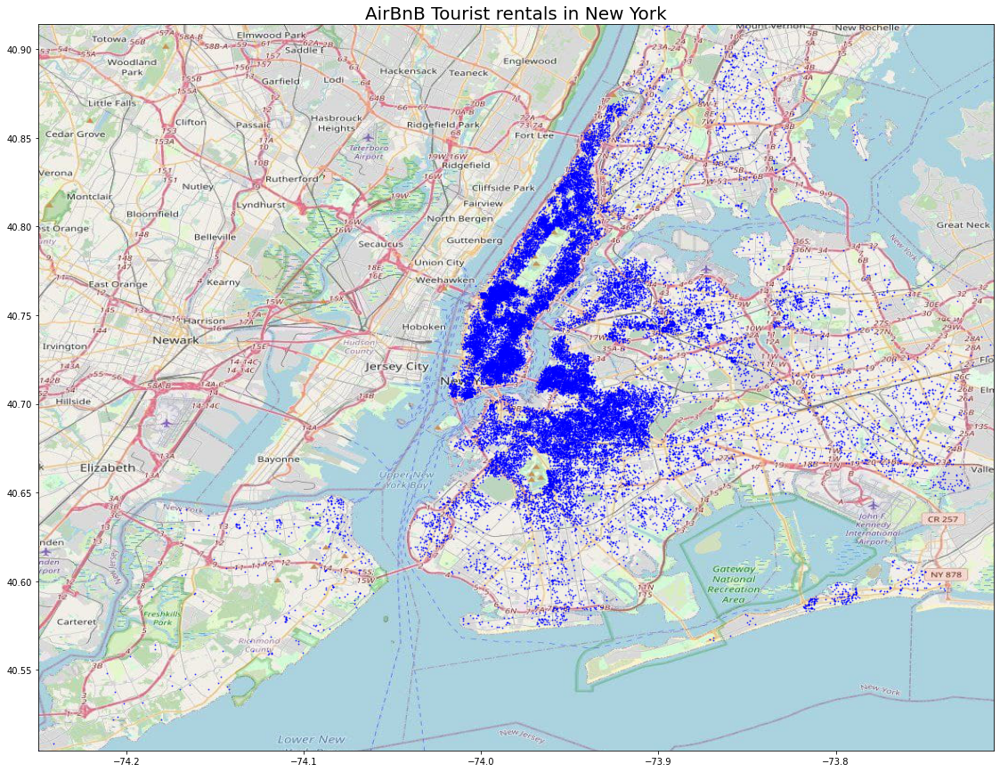

In [ ]:
map1 = plt.imread(path_data + file_map1)
map2 = plt.imread(path_data + file_map2)
map3 = plt.imread(path_data + file_map3)
map4 = plt.imread(path_data + file_map4)

fig, ax = plt.subplots(figsize=(20,15))

ax.scatter(df_airbnb.longitude, df_airbnb.latitude, zorder=1, alpha=0.6, c='blue', s=1)
ax.set_title('AirBnB Tourist rentals in New York', fontsize=20) 
ax.set_xlim(box[0],box[1]) 
ax.set_ylim(box[2],box[3])

ax.imshow(map1, zorder=0, extent=box1)
ax.imshow(map2, zorder=0, extent=box2)
ax.imshow(map3, zorder=0, extent=box3)
ax.imshow(map4, zorder=0, extent=box4)

plt.show()

In [ ]:
places = df_airbnb['neighbourhood_group'].unique()

print('Neighborhoods surveyed in new york:')
print(places)
print('\n')
print("Type rooms present in the dataset:")
print(list(set(df_airbnb['room_type'])))

Neighborhoods surveyed in new york:
['Manhattan' 'Brooklyn' 'Queens' 'Staten Island' 'Bronx']


Type room present in the dataset
['Entire home/apt', 'Hotel room', 'Private room', 'Shared room']


Rooms type distribution per New York's neighbourhood.

In [ ]:
rooms = df_airbnb['room_type'].value_counts()

print('All rooms type available:')
print(rooms)

All rooms type available:
Entire home/apt    20397
Private room       17098
Shared room          572
Hotel room           210
Name: room_type, dtype: int64


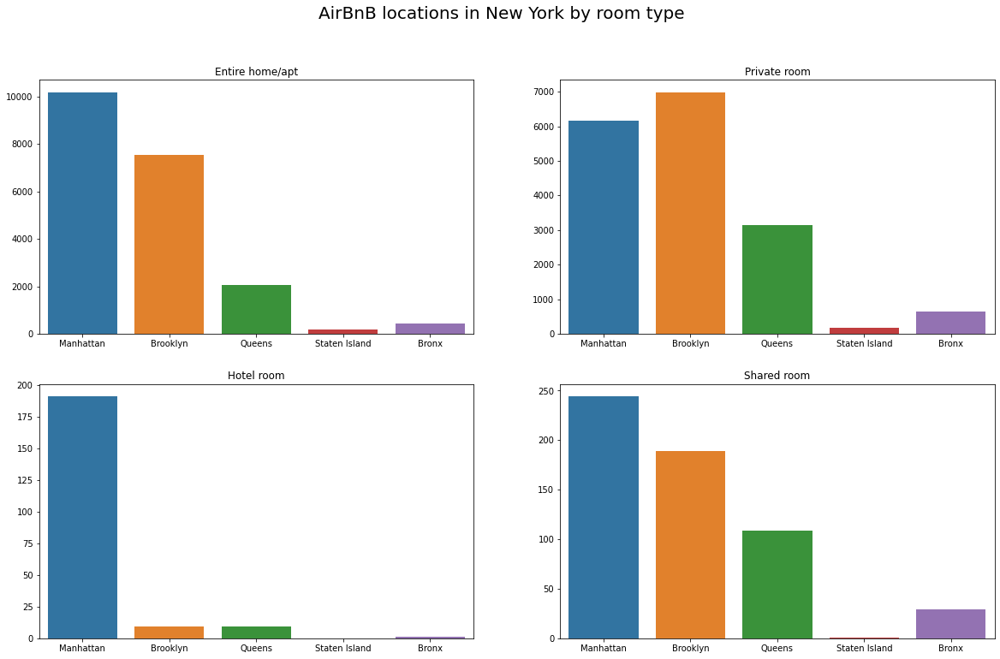

In [ ]:
fig, ax = plt.subplots(2, 2, figsize=(20,12))

fig.suptitle('AirBnB Tourist rentals in New York by room type', fontsize=20)

ax1 = sns.countplot(ax=ax[0,0], x='neighbourhood_group', data=df_airbnb.loc[df_airbnb['room_type']=='Entire home/apt'], order=places)
ax2 = sns.countplot(ax=ax[0,1], x='neighbourhood_group', data=df_airbnb.loc[df_airbnb['room_type']=='Private room'], order=places)
ax3 = sns.countplot(ax=ax[1,0], x='neighbourhood_group', data=df_airbnb.loc[df_airbnb['room_type']=='Hotel room'], order=places)
ax4 = sns.countplot(ax=ax[1,1], x='neighbourhood_group', data=df_airbnb.loc[df_airbnb['room_type']=='Shared room'], order=places)

ax1 = ax1.set(title='Entire home/apt', xlabel=None, ylabel=None)
ax2 = ax2.set(title='Private room', xlabel=None, ylabel=None)
ax3 = ax3.set(title='Hotel room', xlabel=None, ylabel=None)
ax4 = ax4.set(title='Shared room', xlabel=None, ylabel=None)

plt.show()

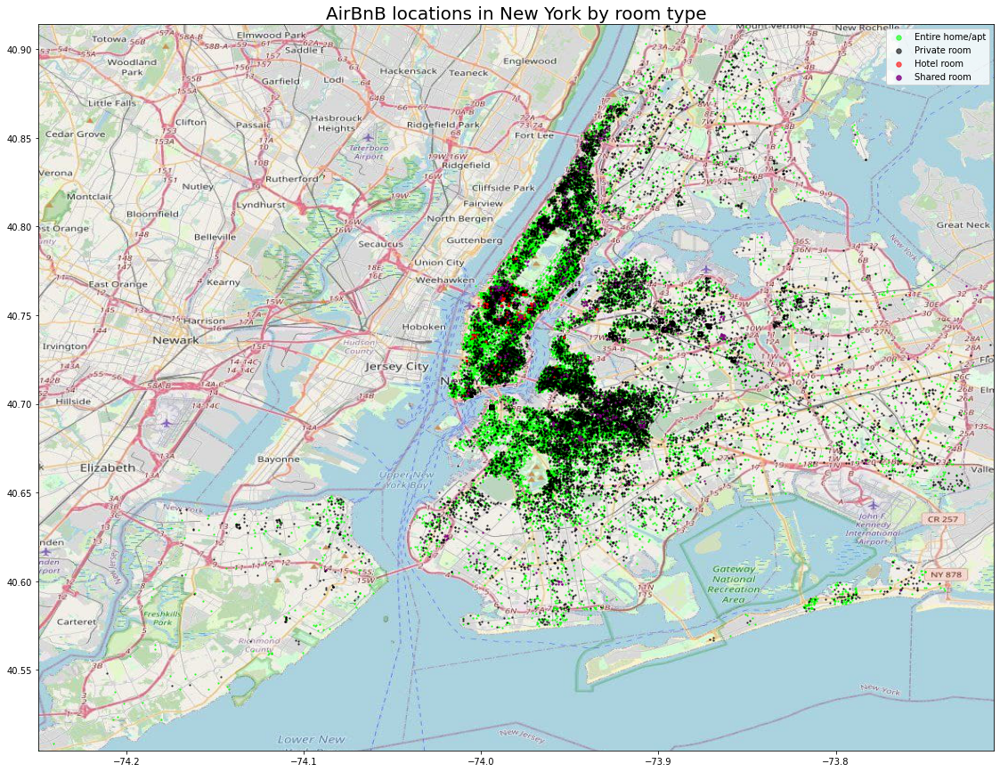

In [ ]:
fig, ax = plt.subplots(figsize=(20,15))

ax.scatter(x='longitude', y='latitude', data=df_airbnb.loc[df_airbnb['room_type']=='Entire home/apt'], zorder=1, alpha= 0.6, c='lime', s=2)
ax.scatter(x='longitude', y='latitude', data=df_airbnb.loc[df_airbnb['room_type']=='Private room'], zorder=1, alpha= 0.6, c='black', s=2)
ax.scatter(x='longitude', y='latitude', data=df_airbnb.loc[df_airbnb['room_type']=='Hotel room'], zorder=1, alpha= 0.6, c='red', s=2)
ax.scatter(x='longitude', y='latitude', data=df_airbnb.loc[df_airbnb['room_type']=='Shared room'], zorder=1, alpha= 0.8, c='purple', s=2)

ax.set_title('AirBnB Tourist rentals in New York by room type', fontsize=20) 

ax.set_xlim(box[0], box[1]) 
ax.set_ylim(box[2], box[3])

legend = ax.legend(['Entire home/apt', 'Private room', 'Hotel room', 'Shared room'], fontsize=10, scatterpoints=1)

for handle in legend.legendHandles:
    handle._sizes = [30]

ax.imshow(map1, zorder=0, extent=box1)
ax.imshow(map2, zorder=0, extent=box2)
ax.imshow(map3, zorder=0, extent=box3)
ax.imshow(map4, zorder=0, extent=box4)

plt.show()

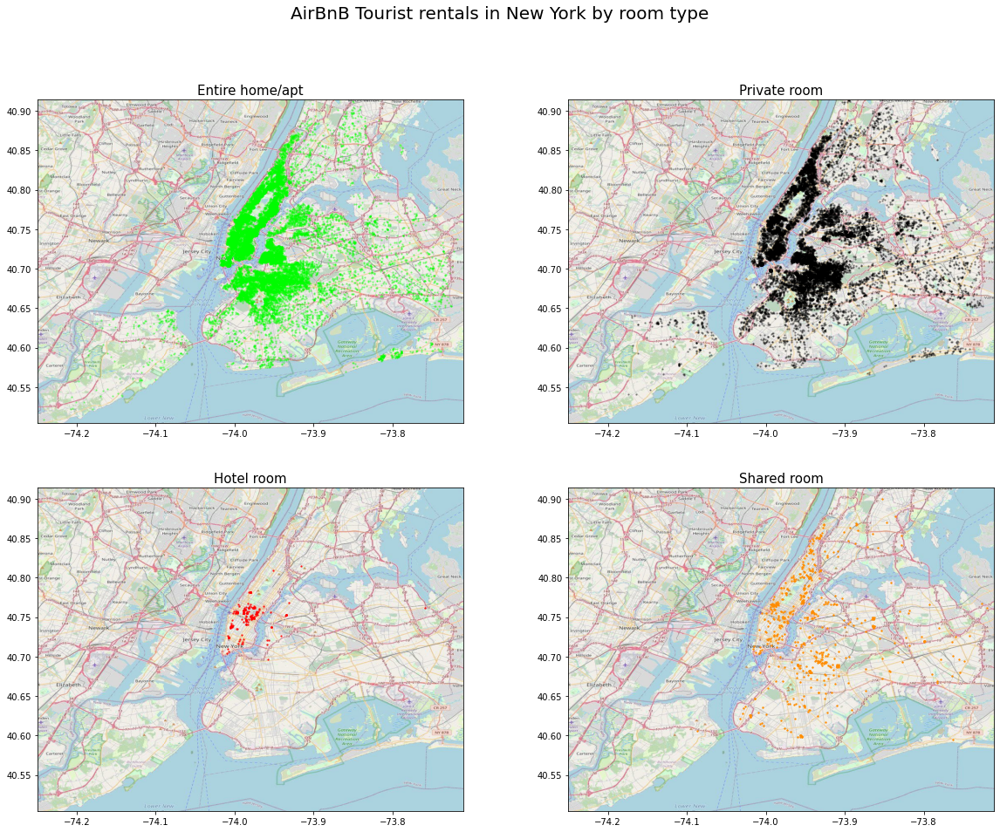

In [ ]:
fig = plt.figure(figsize=(20,15))

fig.suptitle('AirBnB Tourist rentals in New York by room type', fontsize=20)

ax1=fig.add_subplot(2,2,1)
ax2=fig.add_subplot(2,2,2)
ax3=fig.add_subplot(2,2,3)
ax4=fig.add_subplot(2,2,4)

ax1.set_title('Entire home/apt', fontsize=15)
ax2.set_title('Private room', fontsize=15)
ax3.set_title('Hotel room', fontsize=15)
ax4.set_title('Shared room', fontsize=15)

ax1.scatter(x='longitude', y='latitude', data=df_airbnb.loc[df_airbnb['room_type']=='Entire home/apt'], alpha= 0.3, c='lime', s=2)
ax2.scatter(x='longitude', y='latitude', data=df_airbnb.loc[df_airbnb['room_type']=='Private room'], alpha= 0.3, c='black', s=2)
ax3.scatter(x='longitude', y='latitude', data=df_airbnb.loc[df_airbnb['room_type']=='Hotel room'], alpha= 0.7, c='red', s=2)
ax4.scatter(x='longitude', y='latitude', data=df_airbnb.loc[df_airbnb['room_type']=='Shared room'], alpha= 0.9, c='darkorange', s=2)

ax_list = [ax1, ax2, ax3, ax4]

for ax in ax_list:
  ax.set_xlim(box[0],box[1]) 
  ax.set_ylim(box[2],box[3])

  ax.imshow(map1, zorder=0, extent=box1)
  ax.imshow(map2, zorder=0, extent=box2)
  ax.imshow(map3, zorder=0, extent=box3)
  ax.imshow(map4, zorder=0, extent=box4)

plt.show()

#### Features analysis "price"

In [ ]:
print("Total room", len(df_airbnb['price']))
print('Min price', df_airbnb['price'].min())
print('Max price', df_airbnb['price'].max())
print('There are', df_airbnb['id'].loc[df_airbnb['price']==0].count(), 'rooms with the price equal to 0')
print('There are', df_airbnb['id'].loc[df_airbnb['price']>2000].count(), 'rooms with the price higher than 2.000')

Total room 38277
Min price 0
Max price 10000
There are 36 rooms with the price equal to 0
There are 99 rooms with the price higher than 2.000


Distribution of room prices divided by neighbourhood considering prices between \$0 and \$2000.

In [ ]:
df_mod = df_airbnb.loc[(df_airbnb['price'] > 0) & (df_airbnb['price'] <= 2000)]

places = set(df_mod['neighbourhood_group'])

for _, place in enumerate(places) :
  data = df_mod[df_mod['neighbourhood_group'] == place]

  print('Neighbourhood', place.upper())
  print('Max price \$', data['price'].max())
  print('Min price \$', data['price'].min())
  print('Average price \$', int(data['price'].mean()))
  print('------------------------------------------')

Neighbourhood STATEN ISLAND
Max price 1200
Min price 31
Avarege price 115
------------------------------------------
Neighbourhood MANHATTAN
Max price 2000
Min price 10
Avarege price 204
------------------------------------------
Neighbourhood BRONX
Max price 2000
Min price 11
Avarege price 106
------------------------------------------
Neighbourhood QUEENS
Max price 2000
Min price 10
Avarege price 109
------------------------------------------
Neighbourhood BROOKLYN
Max price 2000
Min price 10
Avarege price 133
------------------------------------------


In [ ]:
df_price_no_0 = df_mod.groupby(['neighbourhood_group', 'room_type']).agg(
                              counter = ('id','count'),
                              price_min = ('price', 'min'),
                              price_max = ('price', 'max'),
                              price_mean = ('price', 'mean')
                            ).reset_index()
df_price_no_0

,neighbourhood_group,room_type,counter,price_min,price_max,price_mean
0,Bronx,Entire home/apt,440,28,2000,153.452273
1,Bronx,Private room,634,11,1000,76.047319
2,Bronx,Shared room,29,22,200,59.034483
3,Brooklyn,Entire home/apt,7515,30,2000,186.110047
4,Brooklyn,Hotel room,5,139,349,217.000000
5,Brooklyn,Private room,6989,10,1600,77.872800
6,Brooklyn,Shared room,189,15,1000,63.084656
7,Manhattan,Entire home/apt,10142,10,2000,237.437488
8,Manhattan,Hotel room,160,100,1512,483.837500
9,Manhattan,Private room,6128,11,2000,145.088936


Given the presence of Outleier above 2000 USD and records with a price of 0 USD, it was decided to modify the value of these records with the average of the price values ​​of that neighborhood of that type of room

//////////////////

Prices at \$0 and higher than \$2000 are outleiers. So we decided to replies that values to the average considering neighbourhood and room type.

In [ ]:
df_dict = {}

for i, x in enumerate(df_price_no_0['neighbourhood_group']): 
  df_dict[int(df_price_no_0['price_mean'][i])] = [df_price_no_0['room_type'][i], df_price_no_0['neighbourhood_group'][i]]


In [ ]:
for i, x in enumerate(df_airbnb['price']):
  if x > 2000 or x == 0:
    for key in df_dict:
      if df_airbnb['neighbourhood_group'][i] == df_dict[key][1] and df_airbnb['room_type'][i] == df_dict[key][0]:
        q = key
        df_airbnb['price'][i] = q

print('Max price is', df_airbnb['price'].max())
print('Min price is', df_airbnb['price'].min())
print('There are', df_airbnb['id'].loc[df_airbnb['price']>2000].count(), 'place with price > 2000')
print('There are', df_airbnb['id'].loc[df_airbnb['price']==0].count(), 'places with price = 0')

Max price is 2000
Min price is 10
There are 0 place with price > 2000
There are 0 place with price = 0


Delete of the single record to zero

/////////////////////

There is only one result for price equal to 0, and we haven't data mean to replace it.
So, let's drop it.

In [ ]:
drop_index = df_airbnb.loc[df_airbnb['price']==0].index
df_airbnb.drop(drop_index, inplace=True)

print('Now the minimum price is', df_airbnb['price'].min())

Now the minimum price is 10


Representation of the distribution of minimum, maximum and average prices divided by district

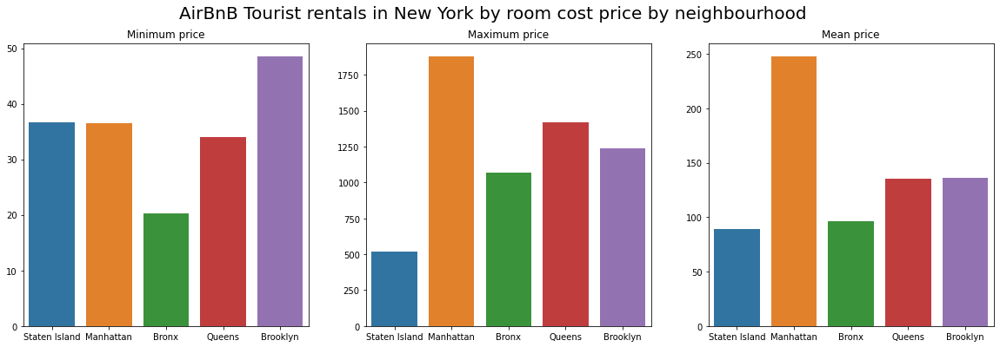

In [ ]:
fig = plt.figure(figsize=(20,6))

fig.suptitle('AirBnB Tourist rentals in New York by room cost price by neighbourhood', fontsize=20)

ax1 = fig.add_subplot(1,3,1)
ax2 = fig.add_subplot(1,3,2)
ax3 = fig.add_subplot(1,3,3)

ax1 = sns.barplot(ax=ax1, x=df_price_no_0['neighbourhood_group'], y=df_price_no_0['price_min'], order=places, ci=None)
ax2 = sns.barplot(ax=ax2, x=df_price_no_0['neighbourhood_group'], y=df_price_no_0['price_max'], order=places, ci=None)
ax3 = sns.barplot(ax=ax3, x=df_price_no_0['neighbourhood_group'], y=df_price_no_0['price_mean'], order=places, ci=None)

ax1 = ax1.set(title='Minimum price', xlabel=None, ylabel=None)
ax2 = ax2.set(title='Maximum price', xlabel=None, ylabel=None)
ax3 = ax3.set(title='Mean price', xlabel=None, ylabel=None)

plt.show()

At this point we see the concentration of prices on the map.

The subdivision will be made into 4 categories: 
*   "low cost" with prices below \$100
*   "mid price" for rooms between \$101 and \$300
*   "expensive" for rooms between \$301 and \$500
*   "luxury" for rooms with price above \$501


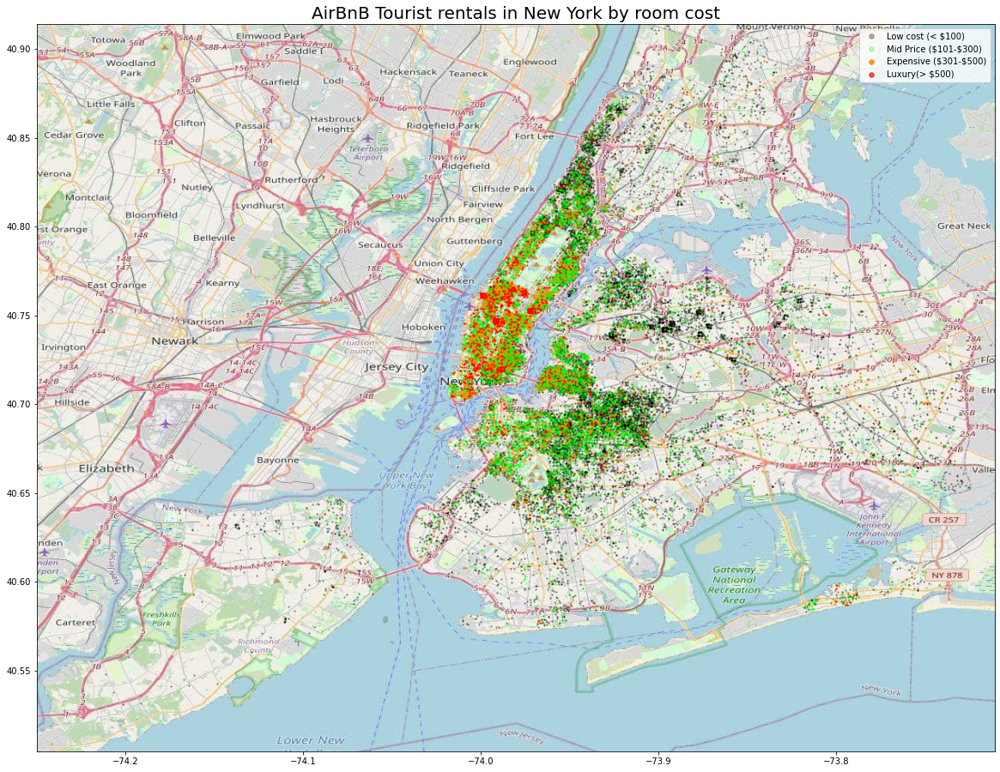

In [ ]:
fig, ax = plt.subplots(figsize=(20,20))

ax.scatter(x='longitude', y='latitude', data=df_airbnb.loc[df_airbnb['price']<=100], alpha= 0.3, c='black', s=2)
ax.scatter(x='longitude', y='latitude', data=df_airbnb.loc[df_airbnb['price'].between(101,300)], alpha= 0.3, c='lime', s=2)
ax.scatter(x='longitude', y='latitude', data=df_airbnb.loc[df_airbnb['price'].between(301, 500)], alpha= 0.9, c='darkorange', s=2)
ax.scatter(x='longitude', y='latitude', data=df_airbnb.loc[df_airbnb['price']>=501], alpha= 0.7, c='red', s=2)

ax.set_title('AirBnB Tourist rentals in New York by room cost', fontsize=20) 
ax.set_xlim(box[0],box[1]) 
ax.set_ylim(box[2],box[3])

legend = ax.legend(['Low cost (< $100)', 'Mid Price (\$101-$300)', 'Expensive (\$301-$500)', 'Luxury(> $500)' ], \
                    fontsize=10, scatterpoints=1)

for handle in legend.legendHandles:
    handle._sizes = [30]

ax.imshow(map1, zorder=0, extent = box1)
ax.imshow(map2, zorder=0, extent = box2)
ax.imshow(map3, zorder=0, extent = box3)
ax.imshow(map4, zorder=0, extent = box4)

plt.show()

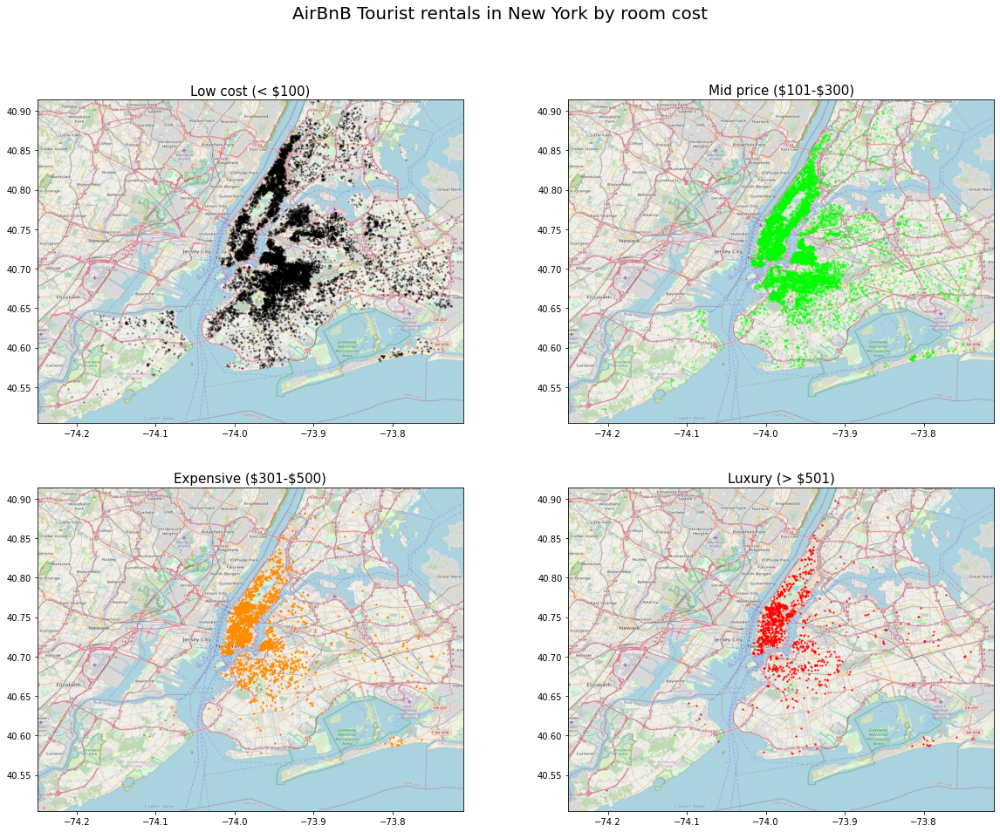

In [ ]:
fig = plt.figure(figsize=(20,15))

fig.suptitle('AirBnB Tourist rentals in New York by room cost', fontsize=20)

ax1=fig.add_subplot(2,2,1)
ax2=fig.add_subplot(2,2,2)
ax3=fig.add_subplot(2,2,3)
ax4=fig.add_subplot(2,2,4)

ax1.set_title('Low cost (< $100)', fontsize=15)
ax2.set_title('Mid price (\$101-$300)', fontsize=15)
ax3.set_title('Expensive (\$301-$500)', fontsize=15)
ax4.set_title('Luxury (> $501)', fontsize=15)

ax1.scatter(x='longitude', y='latitude', data=df_airbnb.loc[df_airbnb['price'] <= 100], alpha=0.3, c='black', s=2)
ax2.scatter(x='longitude', y='latitude', data=df_airbnb.loc[df_airbnb['price'].between(101,300)], alpha=0.3, c='lime', s=2)
ax3.scatter(x='longitude', y='latitude', data=df_airbnb.loc[df_airbnb['price'].between(301, 500)], alpha=0.9, c='darkorange', s=2)
ax4.scatter(x='longitude', y='latitude', data=df_airbnb.loc[df_airbnb['price'] >= 501], alpha=0.7, c='red', s=2)

ax_list = [ax1, ax2, ax3, ax4]

for ax in ax_list:
  ax.set_xlim(box[0],box[1]) 
  ax.set_ylim(box[2],box[3])

  ax.imshow(map1, zorder=0, extent=box1)
  ax.imshow(map2, zorder=0, extent=box2)
  ax.imshow(map3, zorder=0, extent=box3)
  ax.imshow(map4, zorder=0, extent=box4)

plt.show()

Con l'analisi attuale abbiamo voluto portare in evidenza la distribuzione degli alloggi di AirBnB nella citta di New York. 

L'analisi è stata condotta sia sulla distribuzione per quariere ('Manhattan' 'Brooklyn' 'Queens' 'Staten Island' 'Bronx') sia per tilogia di alloggio ('Entire home/apt', 'Hotel room', 'Private room', 'Shared room').

E' stata, inoltre, condotta un'analisi sui prezzi degli alloggi sempre suddividendo i dati per quartiere e per tipologia.

Infine è stata rappresentata una classificazione di fasce di prezzo nella citta di New York.



#TRADOTTO

With the current analysis we wanted to highlight the distribution of AirBnB accommodations in the city of New York.

The analysis was conducted both on the distribution by district ('Manhattan' 'Brooklyn' 'Queens'' Staten Island '' Bronx ') and by accommodation type (' Entire home / apt ',' Hotel room ',' Private room ',' Shared room ').

Furthermore, an analysis was carried out on housing prices, always dividing the data by district and by type.

Finally, a classification of price ranges in the city of New York was represented.